# Data Cleaning and Preprocessing

This notebook prepares GTFS static and real-time data for analysis. It computes arrival delays and generates a cleaned dataset for further visualization and analysis.

In [1]:
!pip install geopandas openpyxl
!pip install gtfs-realtime-bindings

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
from helper_functions import safe_wkt_load, compute_osm_spacing, quick_px_scattermap
from shapely.geometry import Point
import osmnx as ox
from sklearn.cluster import DBSCAN

# 1. Route Shapes

In [3]:
#Source: https://data.vta.org/datasets/VTA::vta-stops-and-routes-october-2025/explore?layer=1
routes_gdf = gpd.read_file('../data/raw/Routes_October_2025.geojson')
routes_gdf = routes_gdf.to_crs("EPSG:2227")

#select routes 22, 522, 23, 523, 25, and 60
selected_routes = ['22', '522', '23', '523', '25', '60']
selected_routes_gdf = routes_gdf[routes_gdf['lineabbr'].isin(selected_routes)]

#rename columns
selected_routes_gdf = selected_routes_gdf.rename(columns={
    'lineid' : 'line_id',
    'lineabbr' : 'route_id',
    'linename' : 'route_desc',
    'SHAPE__Length' : 'route_length',
    'objectid' : 'object_id'
    })

selected_routes_gdf

,line_id,route_id,route_desc,category,route_length,object_id,geometry
2,23875,22,PALO ALTO - EASTRIDGE,Frequent,242559.907697,3,"MULTILINESTRING ((6078120.21 1988261.911, 6078..."
3,23876,23,DE ANZA COL - ALUM ROCK STN,Frequent,120202.952188,4,"MULTILINESTRING ((6158970.5 1948773.359, 61591..."
4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5,"MULTILINESTRING ((6159010.974 1938537.442, 615..."
20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21,"MULTILINESTRING ((6140271.837 1927485.307, 614..."
54,23896,522,PALO ALTO - EASTRIDGE,Rapid,253522.042435,55,"MULTILINESTRING ((6078120.21 1988261.911, 6078..."
55,23897,523,SAN JOSE STATE - LOCKHEED MARTIN,Rapid,162676.690292,56,"MULTILINESTRING ((6117718.556 1975678.574, 611..."


In [4]:
selected_routes_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 6 entries, 2 to 55
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   line_id       6 non-null      int32   
 1   route_id      6 non-null      object  
 2   route_desc    6 non-null      object  
 3   category      6 non-null      object  
 4   route_length  6 non-null      float64 
 5   object_id     6 non-null      int32   
 6   geometry      6 non-null      geometry
dtypes: float64(1), geometry(1), int32(2), object(3)
memory usage: 336.0+ bytes


<Axes: >

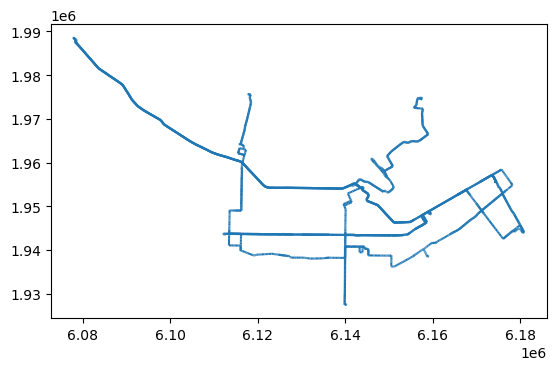

In [5]:
selected_routes_gdf.plot()

# 2. Station Locations and Ridership

In [6]:
#Source: https://data.vta.org/datasets/VTA::vta-stops-and-routes-october-2025/about?layer=0
stations_df = pd.read_csv("../data/raw/Bus_LightRail_Stops.csv")
stations_df

,X,Y,routes,linedirid,rtid,stopname,objectid
0,6.144100e+06,1.954226e+06,22,238750,60001,Santa Clara Transit Center,1
1,6.146822e+06,1.959781e+06,"60, 60",239040,60008,San Jose Airport Terminal A,2
2,6.148115e+06,1.958315e+06,60,239041,60011,San Jose Airport Terminal B,3
3,6.150233e+06,1.960219e+06,60,239041,60014,1st & Metro @ Metro Station,4
4,6.141651e+06,1.954992e+06,"22, 59, 60",238750,60020,El Camino & Lafayette,5
...,...,...,...,...,...,...,...
3245,6.140506e+06,1.930527e+06,26,238821,66063,Civic Center & 3rd,3246
3246,6.157411e+06,1.941970e+06,201,238710,66066,Virginia & Virginia Station,3247
3247,6.146206e+06,1.935440e+06,202,238720,66067,Stokes & Southwest Expressway,3248
3248,6.190774e+06,1.935478e+06,"31, 39",238870,66068,San Felipe & Bowery,3249


In [7]:
#Source: https://data.vta.org/pages/f2ebbac0b3a84c5e958ca45a4676f282
ridership_df = pd.read_excel("../data/raw/October_2025_Ridership_by_Stop.xlsx")
ridership_df = ridership_df.rename(columns={"Stop_ID_Num": "rtid"})
ridership_df

,rtid,SERVICE_PERIOD,MAIN_CROSS_STREET,ROUTES_SERVED,AVG_BOARDINGS,AVG_ALIGHTINGS,AVG_ACTIVITY
0,60001,Weekday,SANTA CLARA TRANSIT CENTER,22,152.880022,110.852250,263.732272
1,60008,Weekday,SAN JOSE AIRPORT - TERMINAL A,60,106.410278,97.183657,203.593936
2,60011,Weekday,SAN JOSE AIRPORT - TERMINAL B,60,101.895229,69.917892,171.813122
3,60014,Weekday,1ST + METRO,60,99.060686,57.995466,157.056152
4,60020,Weekday,EL CAMINO + LAFAYETTE,"22, 59, 60",40.890986,57.438087,98.329073
...,...,...,...,...,...,...,...
3113,66063,Weekday,CIVIC CENTER + 3RD,26,3.281537,14.682573,17.964110
3114,66066,Weekday,VIRGINIA + VIRGINIA STATION,201,0.333333,0.000000,0.333333
3115,66067,Weekday,STOKES + SOUTHWEST EXPWY,202,0.000000,0.357143,0.357143
3116,66068,Weekday,SAN FELIPE + BOWERY,"31, 39",1.279642,0.336508,1.616150


In [8]:
#tie each station to its measured ridership
station_ridership_df = pd.merge(stations_df, ridership_df, on='rtid', how='left')
station_ridership_df

,X,Y,routes,linedirid,rtid,stopname,objectid,SERVICE_PERIOD,MAIN_CROSS_STREET,ROUTES_SERVED,AVG_BOARDINGS,AVG_ALIGHTINGS,AVG_ACTIVITY
0,6.144100e+06,1.954226e+06,22,238750,60001,Santa Clara Transit Center,1,Weekday,SANTA CLARA TRANSIT CENTER,22,152.880022,110.852250,263.732272
1,6.146822e+06,1.959781e+06,"60, 60",239040,60008,San Jose Airport Terminal A,2,Weekday,SAN JOSE AIRPORT - TERMINAL A,60,106.410278,97.183657,203.593936
2,6.148115e+06,1.958315e+06,60,239041,60011,San Jose Airport Terminal B,3,Weekday,SAN JOSE AIRPORT - TERMINAL B,60,101.895229,69.917892,171.813122
3,6.150233e+06,1.960219e+06,60,239041,60014,1st & Metro @ Metro Station,4,Weekday,1ST + METRO,60,99.060686,57.995466,157.056152
4,6.141651e+06,1.954992e+06,"22, 59, 60",238750,60020,El Camino & Lafayette,5,Weekday,EL CAMINO + LAFAYETTE,"22, 59, 60",40.890986,57.438087,98.329073
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3245,6.140506e+06,1.930527e+06,26,238821,66063,Civic Center & 3rd,3246,Weekday,CIVIC CENTER + 3RD,26,3.281537,14.682573,17.964110
3246,6.157411e+06,1.941970e+06,201,238710,66066,Virginia & Virginia Station,3247,Weekday,VIRGINIA + VIRGINIA STATION,201,0.333333,0.000000,0.333333
3247,6.146206e+06,1.935440e+06,202,238720,66067,Stokes & Southwest Expressway,3248,Weekday,STOKES + SOUTHWEST EXPWY,202,0.000000,0.357143,0.357143
3248,6.190774e+06,1.935478e+06,"31, 39",238870,66068,San Felipe & Bowery,3249,Weekday,SAN FELIPE + BOWERY,"31, 39",1.279642,0.336508,1.616150


In [9]:
#set routes data type to str only and if 2 routes share a station, give each its own row for easier filtering by route
station_ridership_df["routes"] = station_ridership_df["routes"].str.split(", ")
station_ridership_df = station_ridership_df.explode("routes")
station_ridership_df = station_ridership_df.drop_duplicates()

#create points for geometry column
station_ridership_gdf_geometry = [Point(xy) for xy in zip(station_ridership_df["X"], station_ridership_df["Y"])]

station_ridership_gdf = gpd.GeoDataFrame(station_ridership_df, geometry=station_ridership_gdf_geometry, crs="EPSG:2227")
station_ridership_gdf

,X,Y,routes,linedirid,rtid,stopname,objectid,SERVICE_PERIOD,MAIN_CROSS_STREET,ROUTES_SERVED,AVG_BOARDINGS,AVG_ALIGHTINGS,AVG_ACTIVITY,geometry
0,6.144100e+06,1.954226e+06,22,238750,60001,Santa Clara Transit Center,1,Weekday,SANTA CLARA TRANSIT CENTER,22,152.880022,110.852250,263.732272,POINT (6144099.628 1954225.52)
1,6.146822e+06,1.959781e+06,60,239040,60008,San Jose Airport Terminal A,2,Weekday,SAN JOSE AIRPORT - TERMINAL A,60,106.410278,97.183657,203.593936,POINT (6146822.451 1959780.783)
2,6.148115e+06,1.958315e+06,60,239041,60011,San Jose Airport Terminal B,3,Weekday,SAN JOSE AIRPORT - TERMINAL B,60,101.895229,69.917892,171.813122,POINT (6148114.706 1958314.711)
3,6.150233e+06,1.960219e+06,60,239041,60014,1st & Metro @ Metro Station,4,Weekday,1ST + METRO,60,99.060686,57.995466,157.056152,POINT (6150233.012 1960218.742)
4,6.141651e+06,1.954992e+06,22,238750,60020,El Camino & Lafayette,5,Weekday,EL CAMINO + LAFAYETTE,"22, 59, 60",40.890986,57.438087,98.329073,POINT (6141651.003 1954992.246)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3246,6.157411e+06,1.941970e+06,201,238710,66066,Virginia & Virginia Station,3247,Weekday,VIRGINIA + VIRGINIA STATION,201,0.333333,0.000000,0.333333,POINT (6157411.327 1941969.795)
3247,6.146206e+06,1.935440e+06,202,238720,66067,Stokes & Southwest Expressway,3248,Weekday,STOKES + SOUTHWEST EXPWY,202,0.000000,0.357143,0.357143,POINT (6146206.479 1935440.473)
3248,6.190774e+06,1.935478e+06,31,238870,66068,San Felipe & Bowery,3249,Weekday,SAN FELIPE + BOWERY,"31, 39",1.279642,0.336508,1.616150,POINT (6190773.704 1935477.602)
3248,6.190774e+06,1.935478e+06,39,238870,66068,San Felipe & Bowery,3249,Weekday,SAN FELIPE + BOWERY,"31, 39",1.279642,0.336508,1.616150,POINT (6190773.704 1935477.602)


In [10]:
#remove unnecessary columns
cols = [
    "routes",
    "linedirid",
    "rtid", 
    "stopname", 
    "AVG_BOARDINGS", 
    "AVG_ALIGHTINGS",
    "AVG_ACTIVITY",
    "geometry"
]

ridership_gdf = station_ridership_gdf[cols].copy()

#clean column names
ridership_gdf = ridership_gdf.rename(columns={
    "routes": "route_id",
    "linedirid": "direction_id",
    "rtid": "stop_id",
    "stopname": "stop_name",
    "AVG_BOARDINGS": "boardings",
    "AVG_ALIGHTINGS": "alightings",
    "AVG_ACTIVITY": "total_b_a"
})

ridership_gdf

,route_id,direction_id,stop_id,stop_name,boardings,alightings,total_b_a,geometry
0,22,238750,60001,Santa Clara Transit Center,152.880022,110.852250,263.732272,POINT (6144099.628 1954225.52)
1,60,239040,60008,San Jose Airport Terminal A,106.410278,97.183657,203.593936,POINT (6146822.451 1959780.783)
2,60,239041,60011,San Jose Airport Terminal B,101.895229,69.917892,171.813122,POINT (6148114.706 1958314.711)
3,60,239041,60014,1st & Metro @ Metro Station,99.060686,57.995466,157.056152,POINT (6150233.012 1960218.742)
4,22,238750,60020,El Camino & Lafayette,40.890986,57.438087,98.329073,POINT (6141651.003 1954992.246)
...,...,...,...,...,...,...,...,...
3246,201,238710,66066,Virginia & Virginia Station,0.333333,0.000000,0.333333,POINT (6157411.327 1941969.795)
3247,202,238720,66067,Stokes & Southwest Expressway,0.000000,0.357143,0.357143,POINT (6146206.479 1935440.473)
3248,31,238870,66068,San Felipe & Bowery,1.279642,0.336508,1.616150,POINT (6190773.704 1935477.602)
3248,39,238870,66068,San Felipe & Bowery,1.279642,0.336508,1.616150,POINT (6190773.704 1935477.602)


In [11]:
#select routes 22, 522, 23, 523, 25, and 60
selected_ridership_gdf = ridership_gdf[ridership_gdf['route_id'].isin(selected_routes)]
selected_ridership_gdf

,route_id,direction_id,stop_id,stop_name,boardings,alightings,total_b_a,geometry
0,22,238750,60001,Santa Clara Transit Center,152.880022,110.852250,263.732272,POINT (6144099.628 1954225.52)
1,60,239040,60008,San Jose Airport Terminal A,106.410278,97.183657,203.593936,POINT (6146822.451 1959780.783)
2,60,239041,60011,San Jose Airport Terminal B,101.895229,69.917892,171.813122,POINT (6148114.706 1958314.711)
3,60,239041,60014,1st & Metro @ Metro Station,99.060686,57.995466,157.056152,POINT (6150233.012 1960218.742)
4,22,238750,60020,El Camino & Lafayette,40.890986,57.438087,98.329073,POINT (6141651.003 1954992.246)
...,...,...,...,...,...,...,...,...
3219,23,238761,66001,San Carlos & Meridian,156.296391,174.049290,330.345680,POINT (6150710.015 1943405.861)
3219,523,238761,66001,San Carlos & Meridian,156.296391,174.049290,330.345680,POINT (6150710.015 1943405.861)
3221,60,239040,66019,San Jose Airport Terminal B,105.515644,69.771954,175.287597,POINT (6148161.172 1958273.948)
3225,25,238790,66033,Clove & Ginger,37.628251,52.159478,89.787729,POINT (6143691.14 1939440.166)


In [12]:
#see quick_px_scattermap in healper_functions.py
fig = quick_px_scattermap(selected_ridership_gdf,
                          hover_data=["stop_id", "route_id"],
                          size="total_b_a",
                          opacity=0.25,
                          zoom=10,
                          height=600
)

fig.show()

In [13]:
selected_routes_gdf.to_csv('../data/processed/selected_routes.csv', index=False)
selected_ridership_gdf.to_csv('../data/processed/selected_station_ridership.csv', index=False)

# 3. City of San Jose Average Daily Traffic

In [14]:
#Source: https://gisdata-csj.opendata.arcgis.com/datasets/CSJ::average-daily-traffic/explore?location=37.332044%2C-121.880204%2C10
adt_df = pd.read_csv('../data/raw/Average_Daily_Traffic.csv')
adt_gdf_geometry = [Point(xy) for xy in zip(adt_df["X"], adt_df["Y"])]

#convert to local projected crs for accurate units (feet)
adt_gdf = gpd.GeoDataFrame(adt_df, geometry=adt_gdf_geometry, crs="EPSG:2227")
adt_gdf = adt_gdf.to_crs("EPSG:2227")
adt_gdf

,X,Y,OBJECTID,FACILITYID,INTID,LATITUDE,LONGITUDE,COUNTDATE,ADT,STREETONE,...,STREETTWO,TRAVELDIRE,NEARINTERS,CITY,ADTONE,ADTTWO,CREATIONDATE,LASTUPDATE,NOTES,geometry
0,6.159659e+06,1.952402e+06,4446,2045,2045,37.348694,-121.883045,2018/03/27 00:00:00+00,5613.0,13TH ST,...,WASHINGTON ST,N/S,13TH ST & WASHINGTON ST,San Jose,2339.0,3274.0,NaN,2021/03/18 17:05:47+00,,POINT (6159659.425 1952401.843)
1,6.165294e+06,1.938841e+06,4447,2046,2046,37.311681,-121.862988,2018/04/10 00:00:00+00,6265.0,7TH ST,...,LEO AVE,N/S,7TH ST & LEO AVE,San Jose,2842.0,3423.0,NaN,2021/03/18 17:05:47+00,,POINT (6165293.598 1938841.482)
2,6.158495e+06,1.951732e+06,4448,2047,2047,37.346808,-121.887016,2018/07/31 00:00:00+00,1043.0,9TH ST,...,WASHINGTON ST,N/S,9TH ST & WASHINGTON ST,San Jose,589.0,454.0,NaN,2021/03/18 17:05:47+00,,POINT (6158494.955 1951732.473)
3,6.158545e+06,1.951646e+06,4449,2048,2048,37.346572,-121.886841,2018/07/31 00:00:00+00,1207.0,9TH ST,...,WASHINGTON ST,N/S,9TH ST & WASHINGTON ST,San Jose,740.0,467.0,NaN,2021/03/18 17:05:47+00,,POINT (6158544.746 1951645.735)
4,6.148940e+06,1.958002e+06,4450,2049,2049,37.363632,-121.920211,2018/08/22 00:00:00+00,14432.0,AIRPORT BLVD,...,SKYPORT DR,One Way,AIRPORT BLVD & SKYPORT DR,San Jose,NaN,NaN,NaN,2021/03/18 17:05:47+00,,POINT (6148939.759 1958001.956)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2394,6.169466e+06,1.956389e+06,7281,4473,4473,37.360029,-121.849505,2021/12/02 00:00:00+00,3994.0,Jose Figueres Ave,...,Rio Guacimal Ct,N/S,Jose Figueres Ave & Rio Guacimal Ct,San Jose,1983.0,2011.0,NaN,2022/04/14 20:14:37+00,NaN,POINT (6169465.578 1956389.19)
2395,6.171081e+06,1.954917e+06,7282,4474,4474,37.356051,-121.843873,2021/12/02 00:00:00+00,1207.0,Scharff Ave,...,Lausett Ave,N/S,Scharff Ave & Lausett Ave,San Jose,656.0,551.0,NaN,2022/04/14 20:14:37+00,NaN,POINT (6171081.379 1954917.494)
2396,6.164263e+06,1.950131e+06,7283,4475,4475,37.342634,-121.867090,2021/12/02 00:00:00+00,3068.0,San Antonio St,...,21st St,E/W,San Antonio St & 21st St,San Jose,1521.0,1547.0,NaN,2022/04/14 20:14:37+00,NaN,POINT (6164262.808 1950130.677)
2397,6.164839e+06,1.950568e+06,7284,4476,4476,37.343858,-121.865132,2021/12/02 00:00:00+00,4238.0,San Antonio St,...,23rd St,E/W,San Antonio St & 23rd St,San Jose,2305.0,1933.0,NaN,2022/04/14 20:14:37+00,NaN,POINT (6164838.516 1950567.683)


In [15]:
#filter out unnecessary cols and clean column names
cols = [
    "OBJECTID",
    "ADT",
    "STREETONE", 
    "DIRECTION", 
    "STREETTWO", 
    "NEARINTERS",
    "geometry"
]

sj_adt_gdf = adt_gdf[cols].copy()

sj_adt_gdf = sj_adt_gdf.rename(columns={
    "OBJECTID" : "counter_id",
    "ADT" : "adt",
    "STREETONE" : "main_road", 
    "DIRECTION" : "counter_location", 
    "STREETTWO" : "cross_road", 
    "NEARINTERS" : "nearby_intersect"
})

#standardize street names
sj_adt_gdf.dropna()
sj_adt_gdf['main_road'] = [item.upper() for item in sj_adt_gdf['main_road']]
sj_adt_gdf['cross_road'] = [item.upper() for item in sj_adt_gdf['cross_road']]
sj_adt_gdf['nearby_intersect'] = [item.upper() for item in sj_adt_gdf['nearby_intersect']]
sj_adt_gdf

,counter_id,adt,main_road,counter_location,cross_road,nearby_intersect,geometry
0,4446,5613.0,13TH ST,N of,WASHINGTON ST,13TH ST & WASHINGTON ST,POINT (6159659.425 1952401.843)
1,4447,6265.0,7TH ST,S of,LEO AVE,7TH ST & LEO AVE,POINT (6165293.598 1938841.482)
2,4448,1043.0,9TH ST,N of,WASHINGTON ST,9TH ST & WASHINGTON ST,POINT (6158494.955 1951732.473)
3,4449,1207.0,9TH ST,S of,WASHINGTON ST,9TH ST & WASHINGTON ST,POINT (6158544.746 1951645.735)
4,4450,14432.0,AIRPORT BLVD,S of,SKYPORT DR,AIRPORT BLVD & SKYPORT DR,POINT (6148939.759 1958001.956)
...,...,...,...,...,...,...,...
2394,7281,3994.0,JOSE FIGUERES AVE,S of,RIO GUACIMAL CT,JOSE FIGUERES AVE & RIO GUACIMAL CT,POINT (6169465.578 1956389.19)
2395,7282,1207.0,SCHARFF AVE,N of,LAUSETT AVE,SCHARFF AVE & LAUSETT AVE,POINT (6171081.379 1954917.494)
2396,7283,3068.0,SAN ANTONIO ST,E of,21ST ST,SAN ANTONIO ST & 21ST ST,POINT (6164262.808 1950130.677)
2397,7284,4238.0,SAN ANTONIO ST,E of,23RD ST,SAN ANTONIO ST & 23RD ST,POINT (6164838.516 1950567.683)


In [16]:
#create a buffer around the selected routes to help select and filter for nearby features
route_buffers = selected_routes_gdf.copy()
route_buffers['geometry'] = route_buffers['geometry'].buffer(250)
route_buffers

,line_id,route_id,route_desc,category,route_length,object_id,geometry
2,23875,22,PALO ALTO - EASTRIDGE,Frequent,242559.907697,3,"POLYGON ((6077535.047 1988551.009, 6077535.02 ..."
3,23876,23,DE ANZA COL - ALUM ROCK STN,Frequent,120202.952188,4,"POLYGON ((6111857.953 1943710.684, 6111858.025..."
4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5,"POLYGON ((6113146.849 1941141.065, 6113146.729..."
20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21,"POLYGON ((6139346.36 1950518.774, 6139346.221 ..."
54,23896,522,PALO ALTO - EASTRIDGE,Rapid,253522.042435,55,"POLYGON ((6077535.047 1988551.009, 6077535.02 ..."
55,23897,523,SAN JOSE STATE - LOCKHEED MARTIN,Rapid,162676.690292,56,"POLYGON ((6113182.132 1943682.682, 6113182.044..."


In [17]:
#select all traffic counters within the buffer
selected_sj_adt = gpd.sjoin(sj_adt_gdf, route_buffers, how="inner", predicate="within")
selected_sj_adt

,counter_id,adt,main_road,counter_location,cross_road,nearby_intersect,geometry,index_right,line_id,route_id,route_desc,category,route_length,object_id
4,4450,14432.0,AIRPORT BLVD,S of,SKYPORT DR,AIRPORT BLVD & SKYPORT DR,POINT (6148939.759 1958001.956),20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21
11,4457,8385.0,ALMADEN AVE,N of,WILLOW ST,ALMADEN AVE & WILLOW ST,POINT (6159716.967 1941603.893),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
23,4469,848.0,BLEWETT AVE,S of,WILLOW ST,BLEWETT AVE & WILLOW ST,POINT (6154536.488 1937960.998),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
24,4470,936.0,BLEWETTE AVE,S of,WILLOW ST,BLEWETTE AVE & WILLOW ST,POINT (6154536.488 1937960.998),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
28,4474,45690.0,BROKAW RD,E of,OAKLAND RD,BROKAW RD&OAKLAND RD,POINT (6156171.62 1964851.784),20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2364,7251,13221.0,KING RD,S of,OCALA AVE,KING RD & OCALA AVE,POINT (6173723.992 1945717.512),2,23875,22,PALO ALTO - EASTRIDGE,Frequent,242559.907697,3
2374,7261,18169.0,STORY RD,E of,BAL HARBOR WAY,STORY RD & BAL HARBOR WAY,POINT (6172131.01 1949785.076),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
2375,7262,20206.0,STORY RD,E of,JACKSON AVE,STORY RD & JACKSON AVE,POINT (6174397.292 1951653.894),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
2376,7263,21056.0,STORY RD,W of,ROBERTS AVE,STORY RD & ROBERTS AVE,POINT (6166346.746 1945014.702),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5


In [18]:
#see quick_px_scattermap in healper_functions.py
fig = quick_px_scattermap(selected_sj_adt,
                          hover_data=["counter_id", "adt"],
                          color="adt",
                          zoom=11,
                          height=600
)

fig.show()

In [19]:
#average daily traffic for streets in San Jose that the selected bus routes run along
selected_sj_adt.to_csv("../data/processed/selected_sj_adt.csv", index=False)

# 4. GTFS Realtime Vehicle Locations

In [20]:
#filter for buffered vehicle locations on routes 22/522/23/523/25/60

#Source: 511 Transit Data (GTFS) API, collected by scripts\01_gtfs_route_location_speed_extractor.ipynb
VEHICLE_CSV = "../data/raw/vehicle_route_location_speed_data_20260326_103149.csv"
OUT_CSV = "../data/processed/vehicle_points_filtered_buffer250ft.csv"

In [21]:
#uncleaned vehicle location data
veh = pd.read_csv(VEHICLE_CSV)
veh = veh.dropna(subset=["lat", "lon", "route_id", "time"])
veh["route_id"] = veh["route_id"].astype(str).str.strip()

veh_gdf = gpd.GeoDataFrame(
    veh,
    geometry=gpd.points_from_xy(veh["lon"], veh["lat"]),
    crs="EPSG:4326"
).to_crs("EPSG:2227")

#use the route buffer from before to select all vehicle locations within the buffer
#this removes out-of-service vehicles on the freeway heading to or from a yard, etc.
veh_in = gpd.sjoin(
    veh_gdf,
    route_buffers[["line_id", "geometry"]],
    how="inner",
    predicate="within"
)

veh_in = veh_in.drop_duplicates(subset=["bus_id", "trip_id", "time", "route_id"])

print("veh_gdf rows:", len(veh_gdf))
print("veh_in rows :", len(veh_in))
print("kept %:", round(len(veh_in) / len(veh_gdf), 3))

veh_gdf rows: 82115
veh_in rows : 80834
kept %: 0.984


In [22]:
# Summary stats (counts before/after by route_id)
before_counts = veh_gdf.groupby("route_id").size().rename("before_n").reset_index()
after_counts  = veh_in.groupby("route_id").size().rename("after_n").reset_index()

counts = before_counts.merge(after_counts, on="route_id", how="left").fillna({"after_n": 0})
counts["after_n"] = counts["after_n"].astype(int)
counts["kept_pct"] = (counts["after_n"] / counts["before_n"]).round(3)

display(counts.sort_values("route_id"))

# save filtered output
veh_in_out = veh_in.drop(columns=[c for c in ["index_right"] if c in veh_in.columns])
veh_in_out.to_csv(OUT_CSV, index=False)
print("Saved:", OUT_CSV)

,route_id,before_n,after_n,kept_pct
0,22,19313,18946,0.981
1,23,11749,11504,0.979
2,25,14307,14140,0.988
3,60,12318,12163,0.987
4,Rapid 522,15920,15707,0.987
5,Rapid 523,8508,8374,0.984


Saved: ../data/processed/vehicle_points_filtered_buffer250ft.csv


In [23]:
#see quick_px_scattermap in healper_functions.py
fig = quick_px_scattermap(veh_in,
                          hover_data=["bus_id", "speed", "route_id"],
                          color="speed",
                          opacity=0.25,
                          zoom=10,
                          height=600
)

fig.show()

# 5. Delay Calculations with GTFS Realtime Trip Updates and GTFS Static Data

In [24]:
#THIS CELL BELOW IS FOR MORE COMPLETE DATA, ALBEIT ON A WEEKEND. I WILL TRY RUNNING CODE TO GET WEEKDAY DATA ON MONDAY

#Source: https://511.org/open-data/transit
# Load GTFS static data
routes = pd.read_csv("../data/raw/gtfs_vta_05042026/routes.txt")
trips = pd.read_csv("../data/raw/gtfs_vta_05042026/trips.txt")
stop_times = pd.read_csv("../data/raw/gtfs_vta_05042026/stop_times.txt")
stops = pd.read_csv("../data/raw/gtfs_vta_05042026/stops.txt")

# Load GTFS-Realtime TripUpdates
tripupdates = pd.read_csv("../data/raw/vehicle_tripupdates_data_20260504_101233.csv")

#keep only the most recent trip update for each trip (largest timestamp)
#otherwise, this could skew averages later on
idx = tripupdates.groupby(['trip_id', 'route_id', 'direction_id', 'stop_sequence', 'stop_id'])['timestamp'].idxmax()
tripupdates = tripupdates.loc[idx].reset_index(drop=True)

#remove excess columns and standardize column names
stops = stops[['stop_code', 'stop_name']].dropna()
stops = stops.rename(columns={'stop_code': 'stop_id'})

In [25]:
# Ensure consistent data types
tripupdates["trip_id"] = tripupdates["trip_id"].astype(str)
stop_times["trip_id"] = stop_times["trip_id"].astype(str)
trips["trip_id"] = trips["trip_id"].astype(str)

tripupdates["stop_id"] = tripupdates["stop_id"].astype(str)
stop_times["stop_id"] = stop_times["stop_id"].astype(str)
stops["stop_id"] = stops["stop_id"].astype(int).astype(str)

tripupdates["stop_sequence"] = tripupdates["stop_sequence"].astype(int)
stop_times["stop_sequence"] = stop_times["stop_sequence"].astype(int)

In [26]:
# Merge realtime and scheduled data
merged = tripupdates.merge(
    stop_times[["trip_id", "stop_sequence", "arrival_time"]],
    on=["trip_id", "stop_sequence"],
    how="left"
)

In [27]:
# Convert scheduled arrival time to seconds
def time_to_seconds(t):
    if pd.isna(t):
        return None
    h, m, s = map(int, t.split(":"))
    return h * 3600 + m * 60 + s

merged["scheduled_arrival_sec"] = merged["arrival_time"].apply(time_to_seconds)

In [28]:
# Convert actual arrival time to local time in seconds
merged["actual_arrival_time"] = pd.to_datetime(
    merged["arr_time"], unit="s", utc=True
).dt.tz_convert("America/Los_Angeles")

merged["actual_arrival_sec"] = (
    merged["actual_arrival_time"].dt.hour * 3600 +
    merged["actual_arrival_time"].dt.minute * 60 +
    merged["actual_arrival_time"].dt.second
)

In [29]:
# Compute delay (seconds)
merged["computed_delay_sec"] = (
    merged["actual_arrival_sec"] - merged["scheduled_arrival_sec"]
)

In [30]:
# Adjust for trips crossing midnight
merged.loc[merged["computed_delay_sec"] < -12 * 3600, "computed_delay_sec"] += 24 * 3600

In [31]:
# Merge route and stop information
merged = merged.merge(trips[["trip_id", "route_id"]], on=["trip_id", "route_id"], how="left")
merged = merged.merge(stops, on="stop_id", how="left")
merged

,trip_id,route_id,direction_id,start_time,start_date,timestamp,stop_sequence,stop_id,arr_time,dep_time,arrival_time,scheduled_arrival_sec,actual_arrival_time,actual_arrival_sec,computed_delay_sec,stop_name
0,3948423,22,0,08:49:00,20260504,1777914750,70,60404,1.777915e+09,NaN,10:13:08,36788,2026-05-04 10:11:21-07:00,36681.0,-107.0,The Alameda & Keeble
1,3948423,22,0,08:49:00,20260504,1777914750,71,60406,1.777915e+09,NaN,10:14:41,36881,2026-05-04 10:11:56-07:00,36716.0,-165.0,The Alameda & Bush
2,3948423,22,0,08:49:00,20260504,1777914750,72,60408,1.777915e+09,NaN,10:15:46,36946,2026-05-04 10:12:56-07:00,36776.0,-170.0,Santa Clara & Montgomery
3,3948423,22,0,08:49:00,20260504,1777914750,73,60409,1.777915e+09,NaN,10:16:27,36987,2026-05-04 10:13:51-07:00,36831.0,-156.0,Santa Clara & Delmas
4,3948423,22,0,08:49:00,20260504,1777914750,74,60410,1.777915e+09,NaN,10:18:08,37088,2026-05-04 10:15:12-07:00,36912.0,-176.0,Santa Clara & Almaden Blvd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19945,3957850,60,1,18:40:00,20260504,1777941753,4,63943,1.777946e+09,NaN,18:44:32,67472,2026-05-04 18:50:30-07:00,67830.0,358.0,Lundy & Trade Zone
19946,3957850,60,1,18:40:00,20260504,1777941753,5,63944,1.777946e+09,NaN,18:44:59,67499,2026-05-04 18:50:40-07:00,67840.0,341.0,Lundy & Fortune
19947,3957850,60,1,18:40:00,20260504,1777941753,6,63945,1.777946e+09,NaN,18:46:49,67609,2026-05-04 18:51:21-07:00,67881.0,272.0,Lundy & Concourse
19948,3957850,60,1,18:40:00,20260504,1777941753,7,63946,1.777946e+09,NaN,18:47:34,67654,2026-05-04 18:51:38-07:00,67898.0,244.0,Lundy & Commerce


In [32]:
# Remove invalid records
cleaned_data = merged.dropna(subset=["computed_delay_sec"])

In [33]:
cleaned_data["computed_delay_sec"].describe()

count    19486.000000
mean       -24.532639
std        323.919532
min      -1496.000000
25%       -163.000000
50%        -64.000000
75%         46.000000
max       2471.000000
Name: computed_delay_sec, dtype: float64

In [34]:
# Save cleaned dataset
cleaned_data.to_csv("../data/processed/cleaned_delay_data.csv", index=False)

print("Cleaned data saved to data/processed/cleaned_delay_data.csv")

Cleaned data saved to data/processed/cleaned_delay_data.csv


# 6. Unified Delay Analysis Table

In [35]:
#load desired datasets: delay calculations, station riderships, and route details
station_avg_delay = pd.read_csv("../data/processed/cleaned_delay_data.csv")
station_avg_ridership = pd.read_csv("../data/processed/selected_station_ridership.csv")
selected_routes_shapes = pd.read_csv("../data/processed/selected_routes.csv")

In [36]:
#filter route table for only the selected routes in this study
selected_routes = ['22', 'Rapid 522', '23', 'Rapid 523', '25', '60']
station_avg_delay = station_avg_delay[station_avg_delay["route_id"].isin(selected_routes)]

#aggregate delay values for each route, direction, station and delay update
station_avg_delay = (
    station_avg_delay
    .groupby(
        ['route_id', 'direction_id', 'stop_id', 'stop_sequence']
    )
    .agg(
        mean_delay=("computed_delay_sec", "mean")
    )
    .reset_index()
    .sort_values(
        ['route_id', 'direction_id', 'stop_sequence']
    )
)

#drop "Rapid" from route names for consistency, then standardize the column to int
station_avg_delay["route_id"] = station_avg_delay["route_id"].str.replace(
    r"^Rapid\s+", "", regex=True
).astype(int)

station_avg_delay

,route_id,direction_id,stop_id,stop_sequence,mean_delay
18,22,0,60328,2,-28.103448
19,22,0,60329,3,79.400000
20,22,0,60330,4,56.566667
21,22,0,60331,5,15.366667
22,22,0,60332,6,-25.566667
...,...,...,...,...,...
739,523,1,62264,25,-436.909091
740,523,1,62265,26,-463.590909
741,523,1,62266,27,-484.045455
742,523,1,62267,28,-523.681818


In [37]:
#standardize direction_ids; rather than unique 6 digit numbers, 
#this makes them all 0 or 1, corresponding to the same in our other datasets
station_avg_ridership['direction_id'] = station_avg_ridership['direction_id'] % 10
station_avg_ridership = station_avg_ridership.sort_values(['route_id', 'direction_id', 'stop_id'])
station_avg_ridership

,route_id,direction_id,stop_id,stop_name,boardings,alightings,total_b_a,geometry
0,22,0,60001,Santa Clara Transit Center,152.880022,110.852250,263.732272,POINT (6144099.62758 1954225.5200159)
4,22,0,60020,El Camino & Lafayette,40.890986,57.438087,98.329073,POINT (6141651.00288408 1954992.24617273)
6,22,0,60035,King & Alum Rock,149.607974,157.936236,307.544210,POINT (6167727.93202934 1953654.17929506)
7,22,0,60036,King & San Antonio,36.418456,38.469837,74.888293,POINT (6168552.89461824 1952565.84026439)
8,22,0,60037,King & Hermocilla,31.495157,45.198273,76.693430,POINT (6169311.51383591 1951509.07203673)
...,...,...,...,...,...,...,...,...
586,523,1,64478,Lockheed Martin Transit Center,0.000000,317.466630,317.466630,POINT (6117801.90097608 1975568.38743506)
601,523,1,64696,Stevens Creek & Winchester,85.577443,90.755989,176.333432,POINT (6139677.16759291 1943518.2914304)
620,523,1,65741,Stevens Creek & Valley Fair / Santana Row,109.060532,391.806776,500.867308,POINT (6141126.594156 1943538.09191573)
642,523,1,65902,Sunnyvale-Saratoga & El Camino,189.107898,219.736022,408.843920,POINT (6116423.22131875 1959757.18710214)


In [38]:
#merge delay and ridership data, and convert to a gdf
stations_df = pd.merge(station_avg_delay, station_avg_ridership, on=['route_id', 'direction_id', 'stop_id'], how='inner')
stations_df["geometry"] = stations_df["geometry"].apply(safe_wkt_load)
stations_gdf = (
    gpd.GeoDataFrame(
        stations_df,
        geometry='geometry',
        crs="EPSG:2227"
    )
    .sort_values(
        ["route_id", "direction_id", "stop_sequence"]
    )
)

stations_gdf

,route_id,direction_id,stop_id,stop_sequence,mean_delay,stop_name,boardings,alightings,total_b_a,geometry
0,22,0,60328,2,-28.103448,Palo Alto Transit Center (Bay 10),733.994859,0.238095,734.176677,POINT (6078107.96 1988346.454)
1,22,0,60329,3,79.400000,El Camino & Palm,12.793264,3.426027,16.219290,POINT (6079055.872 1986640.972)
2,22,0,60330,4,56.566667,El Camino & Galvez,66.459791,7.428228,73.888019,POINT (6079788.226 1985807.876)
3,22,0,60331,5,15.366667,El Camino & Sam McDonald,4.579660,0.262500,4.842160,POINT (6080518.117 1984980.671)
4,22,0,60332,6,-25.566667,El Camino & Churchill,4.251791,1.055649,5.307440,POINT (6081284.46 1984093.848)
...,...,...,...,...,...,...,...,...,...,...
717,523,1,62264,25,-436.909091,Mathilda & Maude,10.363231,41.620255,51.983486,POINT (6117130.545 1968192.871)
718,523,1,62265,26,-463.590909,Mathilda & San Aleso,12.054019,68.420606,80.474624,POINT (6117522.548 1969635.794)
719,523,1,62266,27,-484.045455,Mathilda & Ross,1.095763,59.223451,60.319214,POINT (6118104.047 1971957.972)
720,523,1,62267,28,-523.681818,Mathilda & Moffett Park,0.379121,21.976828,22.355949,POINT (6118481.886 1973928.068)


# 7. Stop Spacing Calculations

In [39]:
#obtain the road network from OSMNX
G = ox.graph_from_place("Santa Clara County, California, USA", network_type="drive")
G = ox.project_graph(G, to_crs="EPSG:2227")

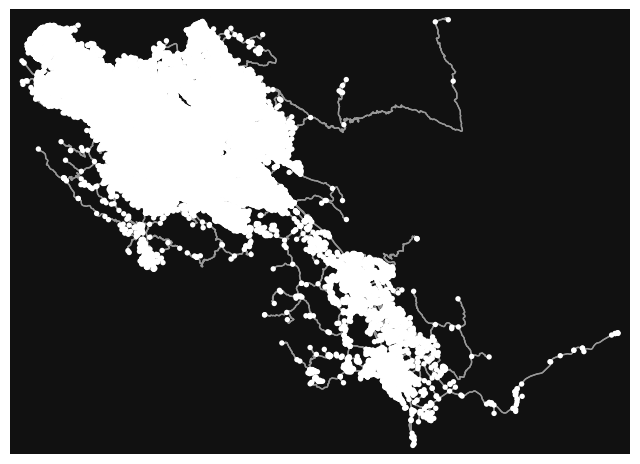

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [40]:
ox.plot_graph(G)

In [41]:
#verify matching crs
stations_gdf = stations_gdf.to_crs(G.graph["crs"])

#find the nearest node to each bus station
#this works well since nearly all bus stations sit at or near an intersection
nodes = ox.distance.nearest_nodes(
    G,
    X=stations_gdf.geometry.x,
    Y=stations_gdf.geometry.y
)

stations_gdf["node"] = nodes
stations_gdf

,route_id,direction_id,stop_id,stop_sequence,mean_delay,stop_name,boardings,alightings,total_b_a,geometry,node
0,22,0,60328,2,-28.103448,Palo Alto Transit Center (Bay 10),733.994859,0.238095,734.176677,POINT (6078107.96 1988346.454),868564168
1,22,0,60329,3,79.400000,El Camino & Palm,12.793264,3.426027,16.219290,POINT (6079055.872 1986640.972),6067350538
2,22,0,60330,4,56.566667,El Camino & Galvez,66.459791,7.428228,73.888019,POINT (6079788.226 1985807.876),1819712513
3,22,0,60331,5,15.366667,El Camino & Sam McDonald,4.579660,0.262500,4.842160,POINT (6080518.117 1984980.671),65518519
4,22,0,60332,6,-25.566667,El Camino & Churchill,4.251791,1.055649,5.307440,POINT (6081284.46 1984093.848),6067033560
...,...,...,...,...,...,...,...,...,...,...,...
717,523,1,62264,25,-436.909091,Mathilda & Maude,10.363231,41.620255,51.983486,POINT (6117130.545 1968192.871),65431385
718,523,1,62265,26,-463.590909,Mathilda & San Aleso,12.054019,68.420606,80.474624,POINT (6117522.548 1969635.794),240434078
719,523,1,62266,27,-484.045455,Mathilda & Ross,1.095763,59.223451,60.319214,POINT (6118104.047 1971957.972),240434069
720,523,1,62267,28,-523.681818,Mathilda & Moffett Park,0.379121,21.976828,22.355949,POINT (6118481.886 1973928.068),6594909329


In [42]:
#calculate station spacings using OSMNX node distances
station_spacings = compute_osm_spacing(stations_gdf, G).dropna()
station_spacings

,route_id,direction_id,stop_id,stop_sequence,mean_delay,stop_name,boardings,alightings,total_b_a,geometry,node,spacing_ft
1,22,0,60329,3,79.400000,El Camino & Palm,12.793264,3.426027,16.219290,POINT (6079055.872 1986640.972),6067350538,697.200342
2,22,0,60330,4,56.566667,El Camino & Galvez,66.459791,7.428228,73.888019,POINT (6079788.226 1985807.876),1819712513,352.118584
3,22,0,60331,5,15.366667,El Camino & Sam McDonald,4.579660,0.262500,4.842160,POINT (6080518.117 1984980.671),65518519,372.144171
4,22,0,60332,6,-25.566667,El Camino & Churchill,4.251791,1.055649,5.307440,POINT (6081284.46 1984093.848),6067033560,309.088220
5,22,0,60333,7,-63.566667,El Camino & Serra,14.807891,3.132274,17.940164,POINT (6082149.768 1983118.266),6067063479,380.384955
...,...,...,...,...,...,...,...,...,...,...,...,...
717,523,1,62264,25,-436.909091,Mathilda & Maude,10.363231,41.620255,51.983486,POINT (6117130.545 1968192.871),65431385,880.271410
718,523,1,62265,26,-463.590909,Mathilda & San Aleso,12.054019,68.420606,80.474624,POINT (6117522.548 1969635.794),240434078,496.158685
719,523,1,62266,27,-484.045455,Mathilda & Ross,1.095763,59.223451,60.319214,POINT (6118104.047 1971957.972),240434069,704.619713
720,523,1,62267,28,-523.681818,Mathilda & Moffett Park,0.379121,21.976828,22.355949,POINT (6118481.886 1973928.068),6594909329,790.720435


In [43]:
#quick visualization
fig = quick_px_scattermap(station_spacings,
                          color="spacing_ft",
                          opacity=0.5,
                          hover_data=["route_id", "direction_id", "stop_sequence", "spacing_ft", "total_b_a"],
                          zoom=10,
                          height=650
)
fig.show()

# 8. Approximate Nearby ADT for Stations where Data is Available

In [44]:
sj_adt = pd.read_csv("../data/processed/selected_sj_adt.csv")

#verify crs and convert to GDF
sj_adt["geometry"] = sj_adt["geometry"].apply(safe_wkt_load)
sj_adt_gdf = gpd.GeoDataFrame(sj_adt, geometry='geometry', crs="EPSG:2227")
sj_adt_gdf

,counter_id,adt,main_road,counter_location,cross_road,nearby_intersect,geometry,index_right,line_id,route_id,route_desc,category,route_length,object_id
0,4450,14432.0,AIRPORT BLVD,S of,SKYPORT DR,AIRPORT BLVD & SKYPORT DR,POINT (6148939.759 1958001.956),20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21
1,4457,8385.0,ALMADEN AVE,N of,WILLOW ST,ALMADEN AVE & WILLOW ST,POINT (6159716.967 1941603.893),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
2,4469,848.0,BLEWETT AVE,S of,WILLOW ST,BLEWETT AVE & WILLOW ST,POINT (6154536.488 1937960.998),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
3,4470,936.0,BLEWETTE AVE,S of,WILLOW ST,BLEWETTE AVE & WILLOW ST,POINT (6154536.488 1937960.998),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
4,4474,45690.0,BROKAW RD,E of,OAKLAND RD,BROKAW RD&OAKLAND RD,POINT (6156171.62 1964851.784),20,23904,60,WINCHESTER STN - MILPITAS BART,Frequent,151256.059019,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,7251,13221.0,KING RD,S of,OCALA AVE,KING RD & OCALA AVE,POINT (6173723.992 1945717.512),2,23875,22,PALO ALTO - EASTRIDGE,Frequent,242559.907697,3
490,7261,18169.0,STORY RD,E of,BAL HARBOR WAY,STORY RD & BAL HARBOR WAY,POINT (6172131.01 1949785.076),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
491,7262,20206.0,STORY RD,E of,JACKSON AVE,STORY RD & JACKSON AVE,POINT (6174397.292 1951653.894),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5
492,7263,21056.0,STORY RD,W of,ROBERTS AVE,STORY RD & ROBERTS AVE,POINT (6166346.746 1945014.702),4,23879,25,DE ANZA COL - VMC - ALUM ROCK STN,Frequent,140850.289491,5


In [45]:
#collect ADT counter coordinates
coords = np.array(list(zip(sj_adt_gdf.geometry.x, sj_adt_gdf.geometry.y)))

# determine clusters of nearby ADT counters and clustering radius (feet)
clustering = DBSCAN(eps=350, min_samples=1).fit(coords)
sj_adt_gdf["cluster"] = clustering.labels_

#determine average adt of vehicles around an intersection
#this roughly handles both traffic on the roadway with the bus stop as well as cross traffic
#because some bus stops are before the intersection and some are after, it can be a bit 
#complicated to determine which ADT counters are most representative for each bus stop
#also because the nearest ADT counter may be on a cross street
adt_clustered = sj_adt_gdf.groupby("cluster").agg({
    "adt": "mean",
    "geometry": "first"
}).reset_index()

#determine the centroid of each cluster, which should roughly center on an intersection
adt_clustered = sj_adt_gdf.dissolve(by="cluster", aggfunc={"adt": "mean"})
adt_clustered["geometry"] = adt_clustered.geometry.centroid
adt_clustered = adt_clustered.reset_index()
adt_clustered

,cluster,geometry,adt
0,0,POINT (6148939.759 1958001.956),14432.000000
1,1,POINT (6159716.967 1941603.893),8385.000000
2,2,POINT (6154826.858 1938135.831),2602.500000
3,3,POINT (6156187.39 1964850.314),42373.500000
4,4,POINT (6154785.569 1964731.863),49988.000000
...,...,...,...
148,148,POINT (6148129.159 1938742.522),10586.000000
149,149,POINT (6159346.467 1948109.352),6374.333333
150,150,POINT (6168046.046 1953273.078),13108.000000
151,151,POINT (6170803.605 1949575.435),31857.500000


In [46]:
#use distance as a proxy for traffic near the station
sj_station_adt = gpd.sjoin_nearest(station_spacings.copy(), adt_clustered, how="left", max_distance=350, distance_col="dist_to_adt").dropna()
sj_station_adt

,route_id,direction_id,stop_id,stop_sequence,mean_delay,stop_name,boardings,alightings,total_b_a,geometry,node,spacing_ft,index_right,cluster,adt,dist_to_adt
61,22,0,60397,63,-35.620690,The Alameda & Newhall,39.263776,15.974944,55.238721,POINT (6146329.01 1950686.114),65539401,451.467693,126.0,126.0,15507.000000,154.200181
62,22,0,60398,64,-61.724138,The Alameda & McKendrie,14.479637,9.542598,24.022235,POINT (6147715.539 1949942.149),65488026,444.149090,78.0,78.0,23472.000000,348.137213
64,22,0,60400,66,-85.517241,The Alameda & Naglee,160.791839,129.707882,290.499721,POINT (6148984.787 1948553.677),65539392,334.019610,86.0,86.0,21743.333333,83.786080
66,22,0,60402,68,-103.310345,The Alameda & Hester,9.997135,9.605140,19.602275,POINT (6150347.347 1947097.217),3678132176,262.724721,127.0,127.0,23240.000000,349.140672
67,22,0,60403,69,-131.321429,The Alameda & Hanchett,120.079722,68.305332,188.385054,POINT (6150818.969 1946595.946),3678132173,193.345821,127.0,127.0,23240.000000,342.564864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
697,523,0,62943,29,-413.625000,7th & Santa Clara,143.234515,177.938383,321.172898,POINT (6159407.567 1948678.317),65468916,108.496893,77.0,77.0,14389.000000,333.345811
699,523,1,60624,6,-108.291667,San Carlos & Barack Obama Blvd,110.744426,49.200355,159.944781,POINT (6154555.783 1943820.343),580402370,2359.121700,10.0,10.0,15538.500000,92.159378
700,523,1,66001,7,-107.500000,San Carlos & Meridian,156.296391,174.049290,330.345680,POINT (6150710.015 1943405.861),281447614,1229.115171,57.0,57.0,19511.250000,124.825786
701,523,1,60634,8,-92.375000,San Carlos & Bascom,105.850666,128.127610,233.978276,POINT (6145412.952 1943448.511),1948671947,1682.062609,64.0,64.0,20418.000000,294.430588


In [47]:
#quick viz
fig = quick_px_scattermap(sj_station_adt,
                          color="adt",
                          opacity=0.5,
                          hover_data=["route_id", "direction_id", "stop_sequence", "spacing_ft", "total_b_a", "adt"],
                          zoom=10,
                          height=650
)
fig.show()

In [48]:
station_spacings.to_csv("../data/processed/stations_delay_ridership_joined.csv", index=False)
sj_station_adt.to_csv("../data/processed/stations_delay_ridership_joined_with_sj_adt.csv", index=False)